**Comparacion Maquina sincrona y GFM**

*Por: Alejandro Garces*

Pereira, 17 de febrero de 2026

In [1]:
# Cargar los paquetes
using LinearAlgebra
using Plots
using ControlSystems
theme(:dark)

In [2]:
# Maquina sincrona
wB = 2*pi*50
Ta = 1.8
kD = 5.7103*wB
pmax = 5
pnom = 0.85
kE = pmax*cos(asin(pnom/pmax))
G_MAQ = tf([wB/Ta],[1,kD/Ta,kE*wB/Ta])

TransferFunction{Continuous, ControlSystemsBase.SisoRational{Float64}}
              174.53292519943295
----------------------------------------------
1.0s^2 + 996.635362766322s + 859.9621741025483

Continuous-time transfer function model

In [3]:
# GFM
mP = 1/kD
Tf = mP*Ta
G_IBR =tf([wB*mP,wB*mP/Tf],[1,1/Tf,wB*mP*kE/Tf])

TransferFunction{Continuous, ControlSystemsBase.SisoRational{Float64}}
  0.17512214769801937s + 174.53292519943298
----------------------------------------------
1.0s^2 + 996.635362766322s + 859.9621741025485

Continuous-time transfer function model

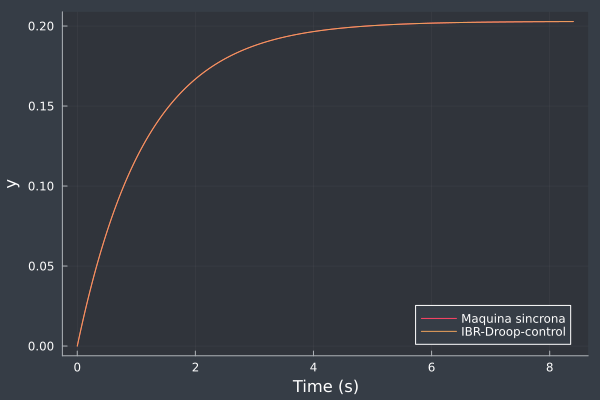

In [4]:
#  Respuesta al escalon
res1 = step(G_MAQ)
res2 = step(G_IBR)
plot(res1,label="Maquina sincrona")
plot!(res2,label="IBR-Droop-control")

In [ ]:
# Informacion sobre respuesta al escalon
println(stepinfo(res2))

StepInfo:
Initial value:     0.000
Final value:       0.203
Step size:         0.203
Peak:              0.203
Peak time:         8.400 s
Overshoot:          0.00 %
Undershoot:         0.00 %
Settling time:     4.490 s
Rise time:         2.537 s



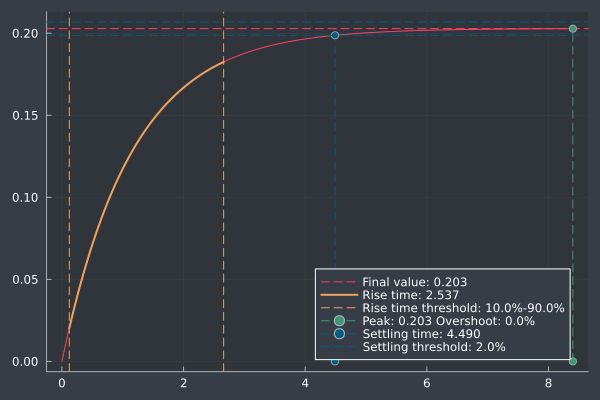

In [ ]:
# Informacion respuesta al escalon
plot(stepinfo(res2))